In [1]:
from matplotlib import pylab as plt
from matplotlib.colors import LogNorm
import lsst.daf.persistence as dp
import lsst.afw.display as display
import lsst.afw.display.rgb as rgb

# get a butler

#butler = dp.Butler("/sps/lsst/dataproducts/desc/DC2/Run2.1i/w_2019_19-v1/rerun/coadd-dr1b-v1-grizy")
butler = dp.Butler("/sps/lsst/dataproducts/desc/DC2/Run2.1i/w_2019_19-v1/rerun/coadd-dr4-v1-grizy")
butler_u = dp.Butler("/sps/lsst/dataproducts/desc/DC2/Run2.1i/w_2019_19-v1/rerun/coadd-dr1b-v1-u")
#dataId = {'tract':4025, 'patch':'4,3'} # z = 0.31 - M = 6.6E14 - 30,22,13 images in i,r,g
#dataId = {'tract':2900, 'patch':'1,2'} # z = 0.29 - M = 6.1E14 - 28,18,10 images in i,r,g - 1,2 - 0,2
dataId = {'tract':4024, 'patch':'3,4'} # z = 0.66 - M = 1.51E15 - 32,24,12 images in i,r,g - 3,4 - 4,4 - 3,3 - 4,3
#dataId = {'tract':3086, 'patch':'5,1'} # z = 1.07 - M = 5.6E14 - 27,18,8 images in i,r,g

bandpass_color_map = {'green':'r', 'red':'i', 'blue':'g'}

# get ref catalog
refs = {}
exposures = {}
for bandpass in bandpass_color_map.values():
    dataId['filter'] = bandpass
#    refs[bandpass] = butler.get('deepCoadd_ref', dataId=dataId)
    if bandpass == 'u':
        exposures[bandpass] = butler_u.get('deepCoadd', dataId=dataId)
    else:
        exposures[bandpass] = butler.get('deepCoadd', dataId=dataId)
    
rgb_im = rgb.makeRGB(*(exposures[bandpass_color_map[color]].getMaskedImage().getImage()
                       for color in ('red', 'green', 'blue')), Q=8, minimum = -0.1, dataRange=1.5, 
                       saturatedPixelValue=100,
                       xSize=None, ySize=None)

fig = plt.figure(figsize=(12,12))
#rgb.displayRGB(rgb_im)

-0.49313757 1078.8276


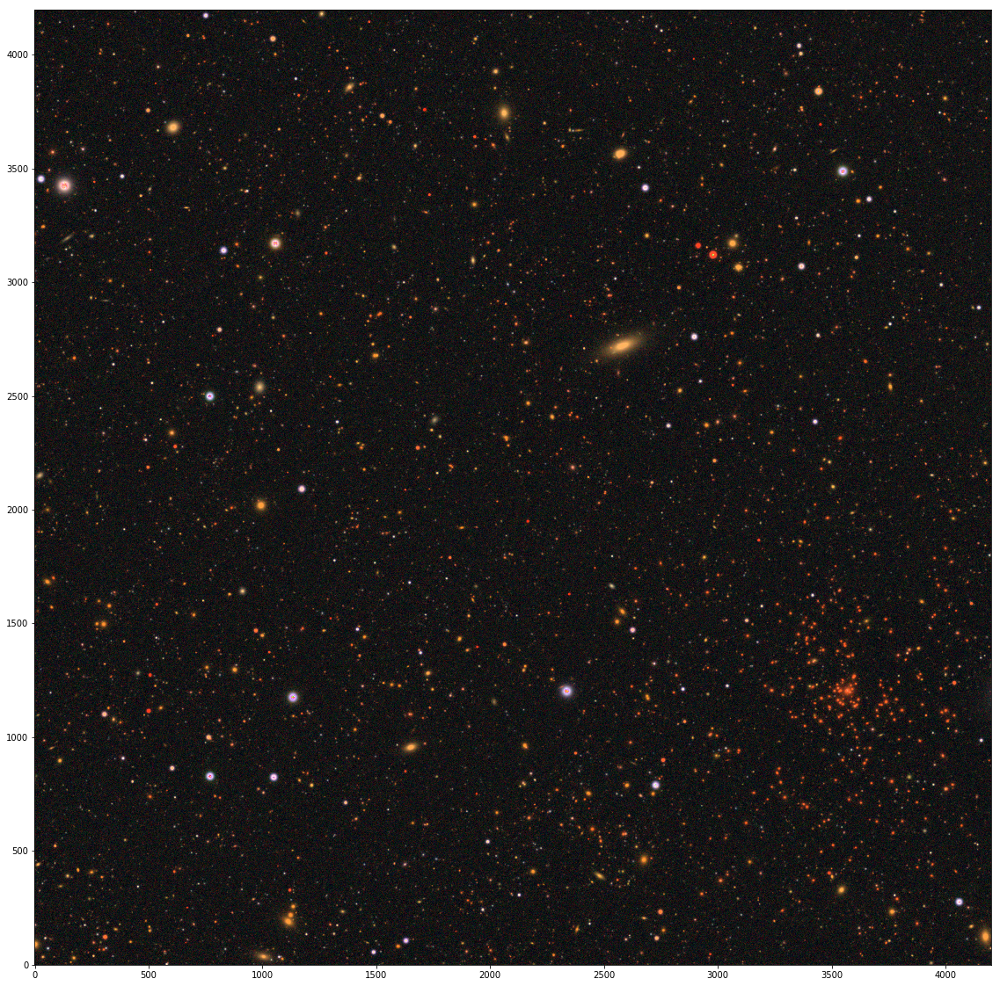

<module 'matplotlib.pyplot' from '/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2019_17/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py'>

In [2]:
array_r = exposures[bandpass_color_map['red']].getMaskedImage().getImage().array
array_g = exposures[bandpass_color_map['green']].getMaskedImage().getImage().array
array_b = exposures[bandpass_color_map['blue']].getMaskedImage().getImage().array
minVal = min(array_r.min(), array_g.min(), array_b.min())
maxVal = min(array_r.max(), array_g.max(), array_b.max())
print(minVal, maxVal)
minVal = -0.1

fig = plt.figure(figsize=(20,20))
# Good looking values are Q=3, dataRange=0.9
rgb_im = rgb.makeRGB(*(exposures[bandpass_color_map[color]].getMaskedImage().getImage()
                       for color in ('red', 'green', 'blue')), Q=5,minimum = minVal, dataRange=1.2, 
                       saturatedPixelValue=maxVal,
                       xSize=None, ySize=None)
#saturatedPixelValue=130,
rgb.displayRGB(rgb_im)

In [19]:
fig.savefig("Run2.1i_rgb_2900_12_02_DR4_5_12.png")

In [3]:
def getBB(skymap, tract, patch):
    bb = None
    tractInfo = skymap[tract]
    for patchInfo in tractInfo:
        if patchInfo.getIndex() == patch:
            bb = patchInfo.getInnerBBox()
            break
    return bb

In [4]:
def str2Tuple(patchS):
    x = int(patchS.split(',')[0])
    y = int(patchS.split(',')[1])
    return (x,y)

In [7]:
import lsst.daf.persistence as dp
import lsst.afw.display as display
import lsst.afw.display.rgb as rgb
import lsst.afw.image as afwImage
from lsst.afw.geom import Box2I, PointI, ExtentI

# get a butler
butler = dp.Butler("/sps/lsst/dataproducts/desc/DC2/Run2.1i/w_2019_19-v1/rerun/coadd-dr4-v1-grizy")

skymap = butler.get("deepCoadd_skyMap")

tract = 4024
dataId = {'tract': tract}
patches = ['3,4', '4,4', '3,3', '4,3']
#patches = ['1,2', '0,2']
bandpass_color_map = {'green':'r', 'red':'i', 'blue':'g'} 

largeImg = {}
bbox = {}
for bandpass in bandpass_color_map.values():
    dataId['filter'] = bandpass
    imgPatch = {}
    for patch in patches:
        dataId['patch'] = patch
        imgPatch[patch] = butler.get('deepCoadd', dataId=dataId).getMaskedImage().getImage()
        patchN = str2Tuple(patch)
        bbox[patch] = getBB(skymap, tract, patchN)
    bigBox = Box2I(PointI(min(bbox[p].getBeginX() for p in patches), min(bbox[p].getBeginY() for p in patches)), 
             PointI(max(bbox[p].getEndX() for p in patches), max(bbox[p].getEndY() for p in patches)))
    largeImg[bandpass] = afwImage.ImageF(bigBox)
    for patch in patches:
        inset = imgPatch[patch].subset(bbox[patch])
        imView = largeImg[bandpass].Factory(largeImg[bandpass], bbox[patch])
        imView[:] = inset
    
rgb_im = rgb.makeRGB(*(largeImg[bandpass_color_map[color]] for color in ('red', 'green', 'blue')), 
                       Q=5, minimum = -0.1, dataRange=1.2, 
                       saturatedPixelValue=100,
                       xSize=None, ySize=None)

In [13]:
rgb_im = rgb.makeRGB(*(largeImg[bandpass_color_map[color]] for color in ('red', 'green', 'blue')), 
                       Q=5, minimum = -0.1, dataRange=1.2, 
                       saturatedPixelValue=100,
                       xSize=None, ySize=None)

8001 8001


Text(450, 7360.92, '1 arcmin')

<Figure size 1440x1440 with 0 Axes>

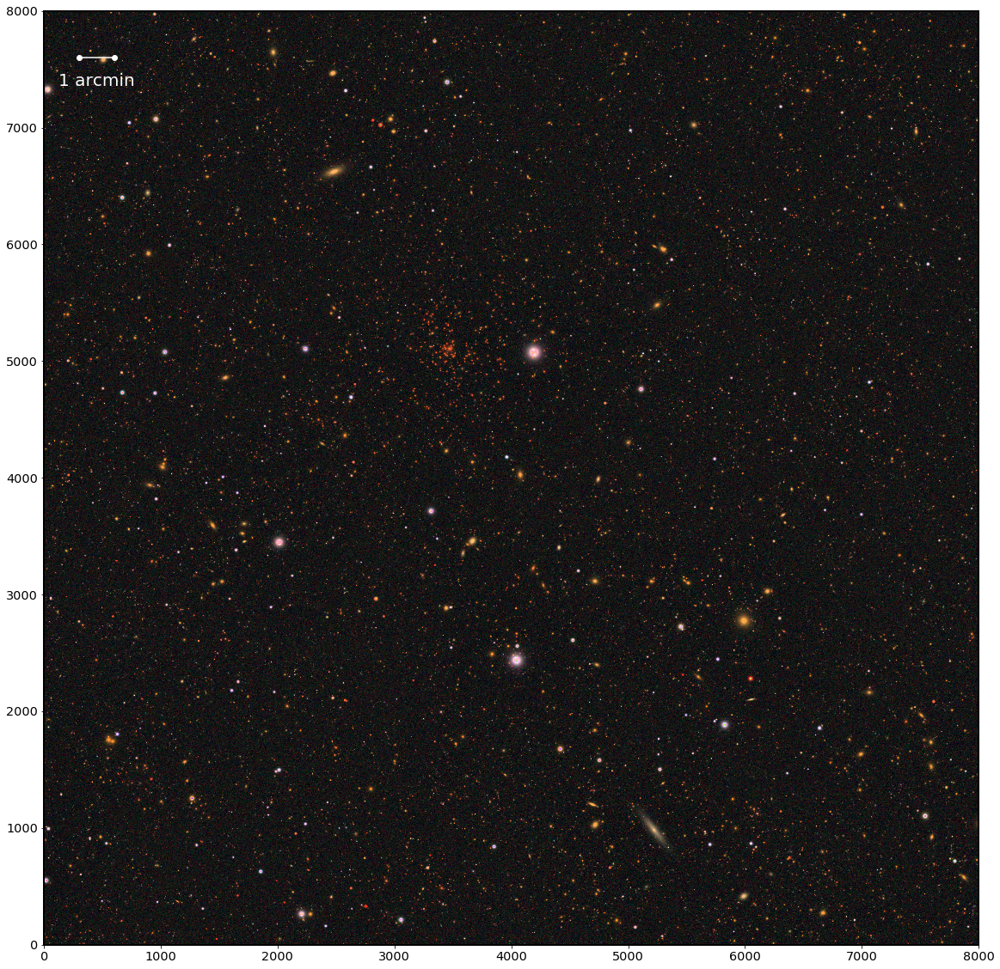

In [8]:
fig = plt.figure(figsize=(20,20))
plt.rcParams['axes.linewidth'] = 2 
plt.rcParams['axes.labelsize'] = 25 
plt.rcParams['xtick.labelsize'] = 'x-large'
plt.rcParams['ytick.labelsize'] = 'x-large'
fig = plt.figure(figsize=(20,20))
print(rgb_im.shape[0],rgb_im.shape[1] )
p = rgb.displayRGB(rgb_im, show=False)
sy = rgb_im.shape[0]
x1, y1 = [300, 600], [0.95*sy, 0.95*sy]
p.plot(x1, y1, marker = 'o', color='white')
p.text(450, 0.92*sy, '1 arcmin', horizontalalignment ='center', color='white', fontsize=20 )

In [16]:
fig.savefig("Run2.1i_rgb_2900_12_02_DR4_5_12_large.png")

(8001, 8001, 3)


Text(250, 2220, '1 arcmin')

<Figure size 1080x1080 with 0 Axes>

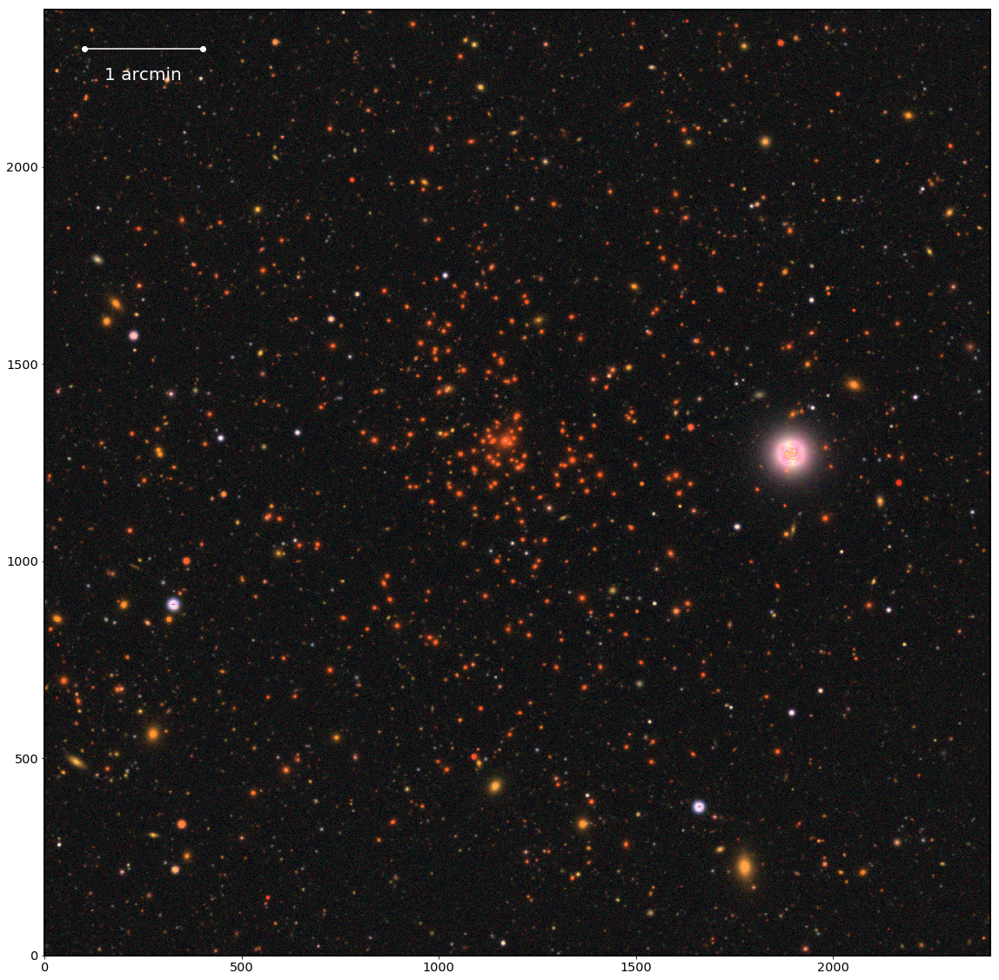

In [9]:
fig = plt.figure(figsize=(15,15))
plt.rcParams['axes.linewidth'] = 2 
plt.rcParams['axes.labelsize'] = 25 
plt.rcParams['xtick.labelsize'] = 'x-large'
plt.rcParams['ytick.labelsize'] = 'x-large'
fig = plt.figure(figsize=(20,20))
print(rgb_im.shape)
p = rgb.displayRGB(rgb_im[3800:6200, 2300:4700,:], show=False)
x1, y1 = [100, 400], [2300, 2300]
p.plot(x1, y1, marker = 'o', color='white')
p.text(250, 2220, '1 arcmin', horizontalalignment ='center', color='white', fontsize=20 )

In [15]:
fig.savefig("Run2.1i_rgb_4024_34_DR4_5_12_zoom2.png")

In [25]:
import lsst.daf.persistence as dp
import lsst.afw.display as display
import lsst.afw.display.rgb as rgb
import lsst.afw.image as afwImage
from lsst.afw.geom import Box2I, PointI, ExtentI

# get a butler
butler = dp.Butler("/sps/lsst/dataproducts/desc/DC2/Run2.1i/w_2019_19-v1/rerun/coadd-dr4-v1-grizy")

skymap = butler.get("deepCoadd_skyMap")

tract = 2900
dataId = {'tract': tract}
patches = ['1,2', '0,2']
bandpass_color_map = {'green':'r', 'red':'i', 'blue':'g'}

largeImg = {}
bbox = {}
for bandpass in bandpass_color_map.values():
    dataId['filter'] = bandpass
    imgPatch = {}
    for patch in patches:
        dataId['patch'] = patch
        imgPatch[patch] = butler.get('deepCoadd', dataId=dataId).getMaskedImage().getImage()
        patchN = str2Tuple(patch)
        bbox[patch] = getBB(skymap, tract, patchN)
    bigBox = Box2I(PointI(min(bbox[p].getBeginX() for p in patches), min(bbox[p].getBeginY() for p in patches)), 
             PointI(max(bbox[p].getEndX() for p in patches), max(bbox[p].getEndY() for p in patches)))
    largeImg[bandpass] = afwImage.ImageF(bigBox)
    for patch in patches:
        inset = imgPatch[patch].subset(bbox[patch])
        imView = largeImg[bandpass].Factory(largeImg[bandpass], bbox[patch])
        imView[:] = inset
    
rgb_im = rgb.makeRGB(*(largeImg[bandpass_color_map[color]] for color in ('red', 'green', 'blue')), 
                       Q=5, minimum = -0.1, dataRange=1.2, 
                       saturatedPixelValue=100,
                       xSize=None, ySize=None)

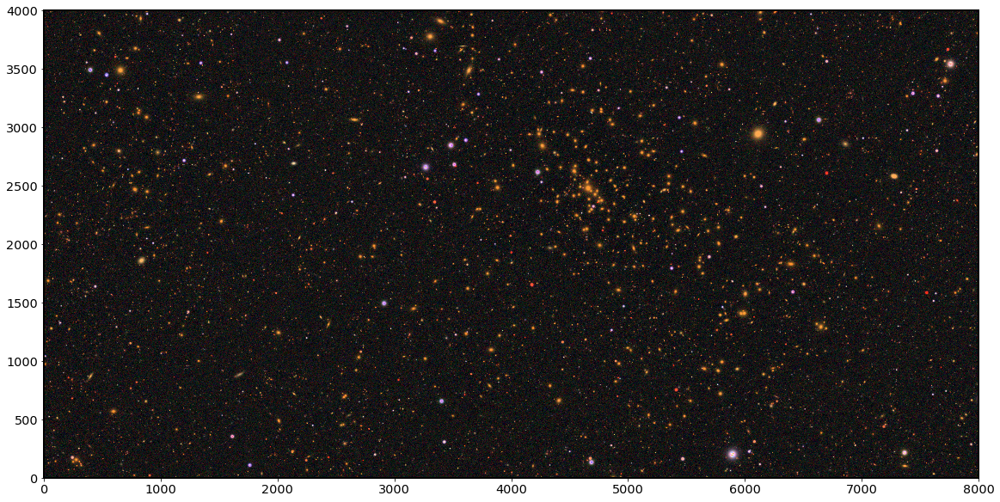

<module 'matplotlib.pyplot' from '/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/w_2019_17/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py'>

In [26]:
fig = plt.figure(figsize=(20,10))
rgb.displayRGB(rgb_im)

(4001, 8001, 3)


Text(750, 3750, '1 arcmin')

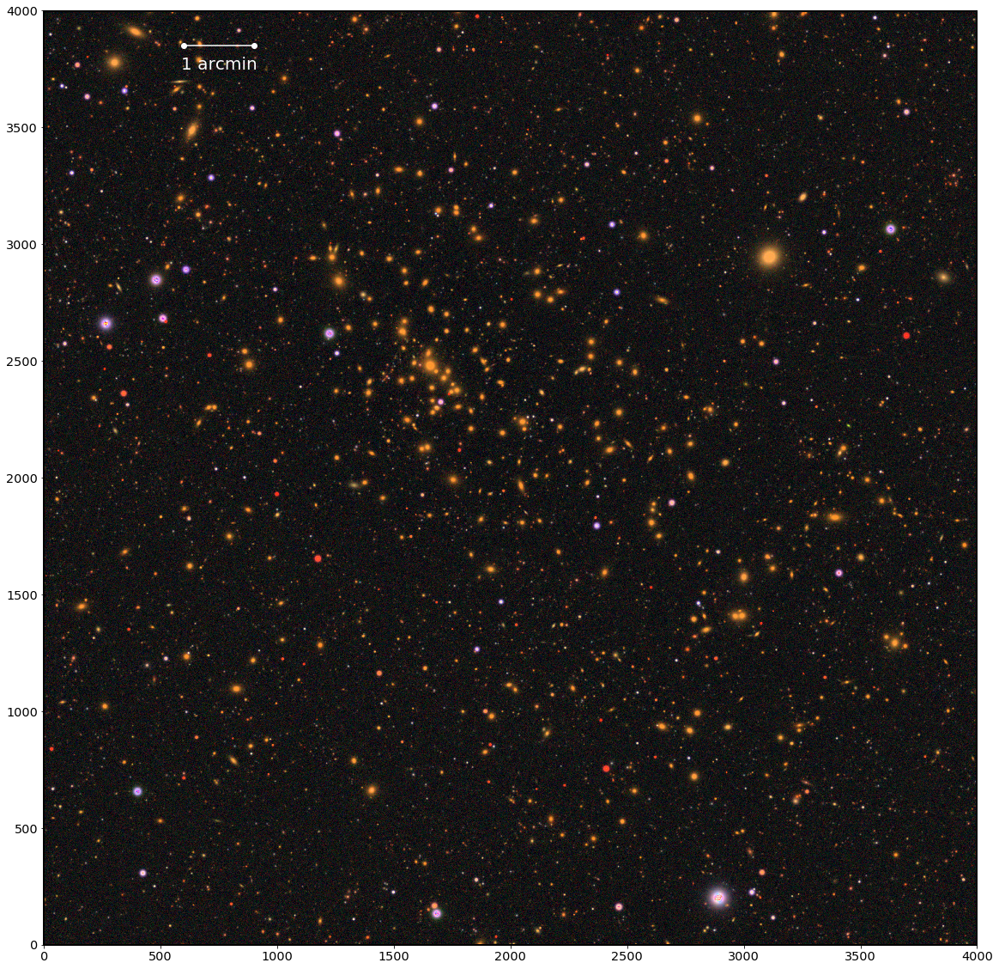

In [27]:
plt.rcParams['axes.linewidth'] = 2 
plt.rcParams['axes.labelsize'] = 25 
plt.rcParams['xtick.labelsize'] = 'x-large'
plt.rcParams['ytick.labelsize'] = 'x-large'
fig = plt.figure(figsize=(20,20))
print(rgb_im.shape)
p = rgb.displayRGB(rgb_im[0:4000,3000:7000,:], show=False)
x1, y1 = [600, 900], [3850, 3850]
p.plot(x1, y1, marker = 'o', color='white')
p.text(750, 3750, '1 arcmin', horizontalalignment ='center', color='white', fontsize=20 )

In [28]:
fig.savefig("Run2.1i_rgb_2900_12_DR4_5_12_zoom1.png")

In [11]:
largeImg['r']

lsst.afw.image.image.image.ImageF=[[-0.01031912  0.0365122   0.06163906 ...  0.13306996 -0.17655502
   0.        ]
 [ 0.10485495 -0.0671717   0.0413046  ... -0.03981803  0.09935248
   0.        ]
 [-0.0193577  -0.05295165 -0.01951412 ... -0.03995161 -0.10334403
   0.        ]
 ...
 [-0.0360066   0.22178954 -0.08392622 ... -0.0342667  -0.03152864
   0.        ]
 [ 0.04596852 -0.07486906 -0.05926157 ... -0.10248997 -0.05662311
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]], bbox=(minimum=(0, 8000), maximum=(8000, 12000))

In [12]:
bigBox

Box2I(minimum=Point2I(0, 8000), dimensions=Extent2I(8001, 4001))

In [29]:
skymap = butler.get("deepCoadd_skyMap")
patchN = str2Tuple('1,2')
print(patchN)
gg = getBB(skymap, 2900, patchN)
print(gg)

(1, 2)
(minimum=(4000, 8000), maximum=(7999, 11999))


In [6]:
t = 4025
p1 = (4,3)
p2 = (4,2)
bb1 = getBB(skymap, t, p1)
bb2 = getBB(skymap, t, p2)
print(bb1)
print(bb2)

(minimum=(16000, 12000), maximum=(19999, 15999))
(minimum=(16000, 8000), maximum=(19999, 11999))


In [7]:
box = Box2I(PointI(min(bb1.getBeginX(), bb2.getBeginX()), min(bb1.getBeginY(), bb2.getBeginY())), 
            PointI(max(bb1.getEndX(), bb2.getEndX()), max(bb1.getEndY(), bb2.getEndY())))
box

Box2I(minimum=Point2I(16000, 8000), dimensions=Extent2I(4001, 8001))

In [19]:
ext = box.getDimensions()
print(ext.getX(), ext.getY())

4001 8001


In [31]:
im1 = exp1.getMaskedImage().getImage()
inset1 = im1.subset(bb1)
im2 = exp2.getMaskedImage().getImage()
inset2 = im2.subset(bb2)

In [33]:
largeIm = ai.ImageF(box)
imView = largeIm.Factory(largeIm, bb1)
imView[:] = inset1
imView = largeIm.Factory(largeIm, bb2)
imView[:] = inset2

In [40]:
import lsst.afw.display.ds9 as ds9

ds9.mtv(largeIm)

In [ ]:
import lsst.afw.image as ai
>>> from lsst.afw.geom import Box2I, PointI, ExtentI
>>> large_im = ai.ImageF(20, 20)
>>> small_im = ai.ImageF(10, 10)
>>> small_im.set(1)
>>> box = Box2I(PointI(0,0), ExtentI(10,10))
>>> im_view = large_im.Factory(large_im, box)
>>> im_view[:] = small_im
>>> small_im.set(2)
>>> box = Box2I(PointI(10,10), ExtentI(10,10))
>>> im_view = large_im.Factory(large_im, box)
>>> im_view[:] = small_im